
В этом тестовом соревновании вам будет предложен датасет, содержащий сведения заболеваемости диабетом среди женщин индейского племени Пима. Подробное описание датасета вместе с необходимыми файлами находится во вкладке Data.

Используя предложенный набор данных при помощи любого алгоритма вам необходимо создать модель, которая будет предсказывать, имеет ли пациент диабет, то есть какое значение принимает переменная Outcome у пациентов Id в тестовой выборке. Во вкладке Notebooks этого соревнования вам доступно Базовое решение (Baseline).

Вам нужно добиться наилучшего показателя качества работы вашей модели: в данном случае – F-мера (чем ее значение ближе к 1, тем работа модели лучше). Данные уже разделены на обучающую и тестовую выборки. Обучите модель и сделайте предсказания на тестовой выборке.

Для успешного прохождения соревнования ваш score должен быть равен или больше 0.68

Предсказания вам нужно будет сохранить в отдельный файл. Обратите внимание на его структуру: он должен состоять из двух столбцов – Id и Outcome. Пример структуры файла с вашем предсказанием также размещен в этом соревновании (sample_submission.csv). В случае, если структура файла не будет соответствовать той, что содержится в примере, ваше решение не будет принято и не отобразится в рейтинге.

Датасет собран на основе исследований Национального института здравоохранения США. В нем принимали участие женщины-представительницы индейского племени Пима старше 21 года.

Датасет состоит из нескольких признаков и одной целевой переменной Outcome (0 - пациентка не больна диабетом, 1 - больна). Среди других переменных: количество беременностей, которые имела пациентка, индекс массы тела, уровень инсулина, возраст и другие.

In [219]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold, KFold
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, VotingClassifier
import xgboost as xgb
import catboost as catb
import lightgbm as lgbmfrom
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, VotingClassifier
import xgboost as xgb
import catboost as catb
import lightgbm as lgbm
from sklearn.model_selection import GridSearchCV, cross_val_score, learning_curve
from sklearn.metrics import classification_report, f1_score, precision_score, recall_score
from sklearn.model_selection import RandomizedSearchCV
from tqdm import tqdm
from sklearn.base import clone
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from vecstack import stacking

### Используемые функции

In [220]:
def show_proba_calibration_plots(y_predicted_probs, y_true_labels, min_value=0.1, max_value=0.9, values_count=10):
    preds_with_true_labels = np.array(list(zip(y_predicted_probs, y_true_labels)))

    thresholds = []
    precisions = []
    recalls = []
    f1_scores = []
    limit = []

    for threshold in np.linspace(min_value, max_value, values_count):
        thresholds.append(threshold)
        precisions.append(precision_score(y_true_labels, list(map(int, y_predicted_probs > threshold))))
        recalls.append(recall_score(y_true_labels, list(map(int, y_predicted_probs > threshold))))
        f1_scores.append(f1_score(y_true_labels, list(map(int, y_predicted_probs > threshold))))
        limit.append(0.68)

    scores_table = pd.DataFrame({'f1':f1_scores,
                                 'precision':precisions,
                                 'recall':recalls,
                                 'probability':thresholds}).sort_values('probability', ascending=True).round(3)
  
    figure = plt.figure(figsize = (15, 5))

    plt1 = figure.add_subplot(121)
    plt1.plot(thresholds, precisions, label='Precision', linewidth=4)
    plt1.plot(thresholds, recalls, label='Recall', linewidth=4)
    plt1.plot(thresholds, f1_scores, label='F1', linewidth=4)
    plt1.plot(thresholds, limit, label='Limit', linewidth=2)
    plt1.set_ylabel('Scores')
    plt1.set_xlabel('Probability threshold')
    plt1.set_title('Probabilities threshold calibration')
    plt1.legend(bbox_to_anchor=(0.25, 0.25))   
    plt1.table(cellText = scores_table.values,
               colLabels = scores_table.columns, 
               colLoc = 'center', cellLoc = 'center', loc = 'bottom', bbox = [0, -1.3, 1, 1])

    plt2 = figure.add_subplot(122)
    plt2.hist(preds_with_true_labels[preds_with_true_labels[:, 1] == 0][:, 0], 
              label='Another class', color='royalblue', alpha=1)
    plt2.hist(preds_with_true_labels[preds_with_true_labels[:, 1] == 1][:, 0], 
              label='Main class', color='darkcyan', alpha=0.8)
    plt2.set_ylabel('Number of examples')
    plt2.set_xlabel('Probabilities')
    plt2.set_title('Probability histogram')
    plt2.legend(bbox_to_anchor=(1, 1))

    plt.show()

In [221]:
def get_classification_report(y_train_true, y_train_pred, y_test_true, y_test_pred):
    print('Train subset\n\n' + classification_report(y_train_true, y_train_pred))
    print('Test subset\n\n' + classification_report(y_test_true, y_test_pred))

In [222]:
def fit_and_show(clf, X_train, X_test, y_train, y_test):
    clf.fit(X_train, y_train)
    y_train_pred = clf.predict(X_train)
    y_test_pred = clf.predict(X_test)
    get_classification_report(y_train, y_train_pred, y_test, y_test_pred)

In [223]:
def calculate_cross_val_score(X, y, classifiers, random_state = 42, cv = StratifiedKFold(n_splits=5)):
    cv_results = []
    for classifier in classifiers.values() :
        cv_results.append(cross_val_score(classifier, X, y = y, scoring = 'f1', cv = cv, n_jobs=-1))
    cv_means = []
    cv_std = []
    for cv_result in cv_results:
        cv_means.append(cv_result.mean())
        cv_std.append(cv_result.std())

    cv_res = pd.DataFrame({"Mean score":cv_means,"Std score": cv_std,"Algorithm":list(classifiers.keys())})
    g = sns.barplot(x="Mean score", y="Algorithm",data = cv_res, palette="Set3",orient = "h",**{'xerr':cv_std})
    g.set_xlabel("F1")
    g = g.set_title("Cross validation scores")
    return cv_res

In [224]:
def get_category_ratio(df, features):
    column_ratio_dict = {}
    column_ration_df_dict = {}
    for col in features:
        category_dict = {}
        for category in list(df[col].unique()):
            a = train_df[(df[col] == category) & (df['Credit Default'] == 1)][col].count()
            b = train_df[(df[col] == category) & (df['Credit Default'] == 0)][col].count()
            c = train_df[(df[col] == category)][col].count()
            category_dict[category] = {'Yes': np.round(a/c, 3), 'No': np.round(b/c, 3)}
        column_ratio_dict[col] = category_dict
        column_ration_df_dict[col] = pd.DataFrame(column_ratio_dict[col])
    return column_ration_df_dict

In [225]:
# Функция строит график корреляции для указанной перемен
def corr_plot(df, column_corelation):
    corr = df.corr()[column_corelation]
    ind = list(corr.index)
    sns.set_style('darkgrid')
    x = corr.values
    y = ind
    obj = {}
    for i in range(len(y)):
        obj[y[i]] = x[i]
    sorted_dict = dict(sorted(obj.items(), key=lambda item: item[1], reverse=True))
    plt.figure(figsize=(15,8))
    sns.barplot(x,y, order=sorted_dict.keys()) 
    

In [226]:
def raspred_hist(num_features):
    fig, axes = plt.subplots(8, 1, figsize=(10, 40))
    for ax, col in zip(axes, num_features):
        sns.distplot(df[col], bins=20, ax=ax)

In [227]:
# Для просмотра бокс плотов и отлавливания выбросов
def drawboxplot(df):
    '''Бокс плот по всем полям'''
    plt.rcParams['figure.figsize']=20,8 
    sns.boxplot(data=df, palette='rainbow', orient='h')

In [228]:
# Функция выводит тепловую карту
def corr_map(df):
    corr = df.corr()
    fig = plt.figure(figsize=(21,25))
    ax = sns.heatmap(corr, annot = True, linewidths=.5, square=True)
    i, k = ax.get_ylim()
    ax.set_ylim(i+0.5, k-0.5)
    plt.show()

In [229]:
def show_one_box_plot(df, target):
    fig = plt.figure(figsize=(15,2))
    sns.boxplot(data=df, y=target,  orient='h');

In [230]:
def box_plotes(target, df, num_features):
    fig, axes = plt.subplots(9, 1, figsize=(20, 30))
    for ax, col in zip(axes, num_features):
        sns.boxplot(data=df,  x=target, y=col,  orient='v', ax=ax);

In [231]:
# генераторы признаков квадраты и логорифмы
def create_poly_features(data, num_features):
    poly_features = np.power(data[num_features], 2)
    poly_features = poly_features.rename(columns=dict(zip(data.columns, [col+' sqr' for col in data.columns])))
    return data.join(poly_features)

def create_log_features(data, num_features):
    log_features = np.log(data[num_features], where=data[num_features]>0)
    log_features = log_features.rename(columns=dict(zip(data.columns, [col+'_log' for col in data.columns])))
    return data.join(log_features)

In [232]:
def show_learning_curve_plot(clf, X, y, cv = StratifiedKFold(n_splits=5), n_jobs=-1, train_sizes=np.linspace(.1, 1.0, 5)):

    train_sizes, train_scores, test_scores = learning_curve(clf, X, y, 
                                                            cv=cv, 
                                                            scoring='f1',
                                                            train_sizes=train_sizes, 
                                                            n_jobs=n_jobs)
    train_scores_mean = np.mean(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    plt.figure(figsize=(15,8))
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Train score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Test cross score")

    plt.title(f"Learning curves ({type(clf).__name__})")
    plt.ylabel("Score")     
    plt.legend(loc="best")
    plt.grid()
    plt.show()

In [233]:
# функция считает количество нулей у заданных колонок
def get_zero_count(df, my_columns):
    for title in my_columns:
        column = df[title]
        print (f'{title} - {column.loc[column == 0].count()}') 

In [234]:
# прочитаем данные из файла
df = pd.read_csv('./data/train.csv')

# Анализ данных

In [235]:
# посмотрим да датафрейм
df.head(20)
num_features = ['Pregnancies', 'Glucose', 'BMI', 'Age'] # Insulin

In [236]:
# Посмотрим на пропуски и выбросы
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 552 entries, 0 to 551
Data columns (total 10 columns):
Pregnancies                 552 non-null int64
Glucose                     552 non-null int64
BloodPressure               552 non-null int64
SkinThickness               552 non-null int64
Insulin                     552 non-null int64
BMI                         552 non-null float64
DiabetesPedigreeFunction    552 non-null float64
Age                         552 non-null int64
Outcome                     552 non-null int64
Id                          552 non-null int64
dtypes: float64(2), int64(8)
memory usage: 43.2 KB


In [237]:
# Проверим наличие пропусков
df.isna().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
Id                          0
dtype: int64

In [238]:
# Посмотрим сколько данных в колонках запонено нулем там где это не возможно
not_normal_zero_value_column = ['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI']
get_zero_count(df, not_normal_zero_value_column)

Glucose - 3
BloodPressure - 28
SkinThickness - 160
Insulin - 262
BMI - 6


In [239]:
# посмотрим статистические данные
df.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome,Id
count,552.000000,552.000000,552.000000,552.000000,552.000000,552.000000,552.000000,552.000000,552.000000,552.000000
mean,3.913043,121.599638,68.164855,20.648551,82.711957,31.939674,0.471433,33.440217,0.358696,382.065217
std,3.413389,31.152296,19.960033,15.803571,116.337602,7.785607,0.332835,11.944216,0.480053,217.854443
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000,1.000000
25%,1.000000,100.000000,62.000000,0.000000,0.000000,27.200000,0.238000,24.000000,0.000000,195.750000
50%,3.000000,118.500000,70.000000,23.000000,41.500000,32.000000,0.370500,29.000000,0.000000,380.500000
75%,6.000000,140.000000,80.000000,33.000000,130.000000,35.925000,0.630250,41.000000,1.000000,567.250000
max,17.000000,199.000000,122.000000,63.000000,846.000000,67.100000,2.420000,81.000000,1.000000,766.000000


Видим что пропусков нет и данные все числовые

In [240]:
# Посмотрим на график кореляции

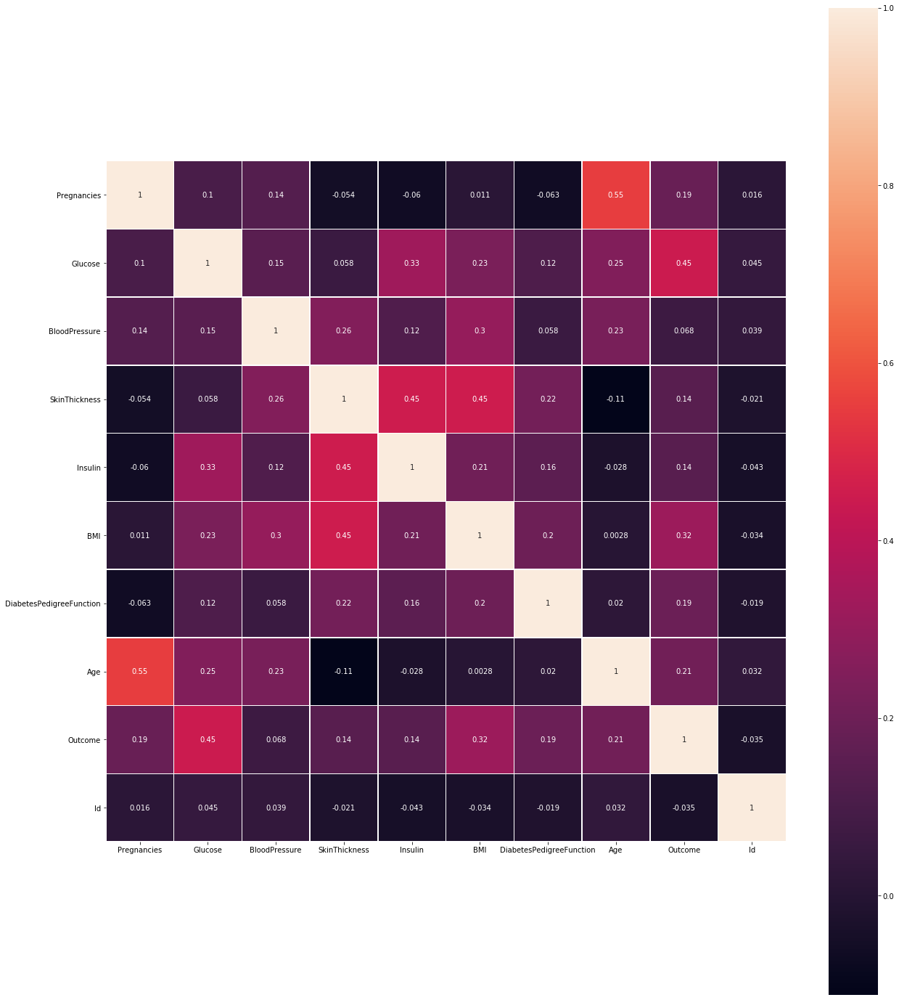

In [21]:
corr_map(df)

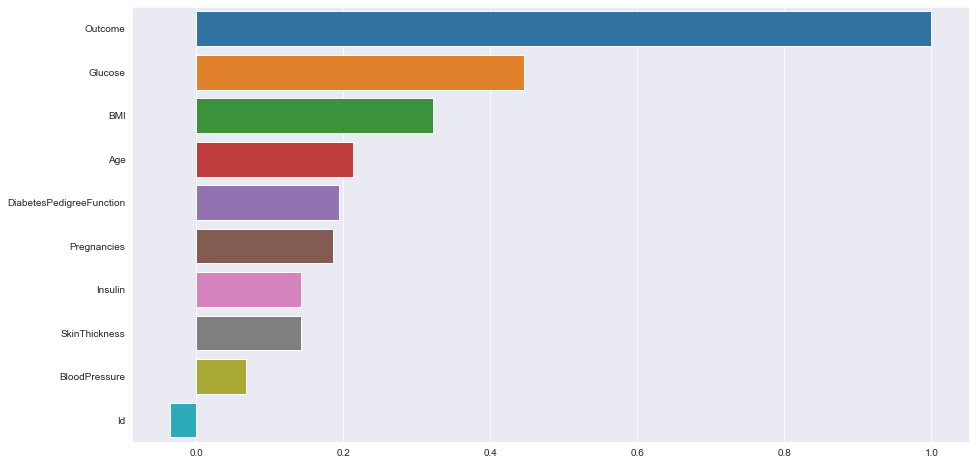

In [22]:
# Посмотрим на корреляцию с целевой переменной
corr_plot(df, 'Outcome')

Итак мы видим что наибольную кореляцию с сахарным диабетом имеет

* Glucose - глюкоза
* BMI - индекс массы тела
* Age - возраст
* DiabetesPedigreeFunction - диабет у родственников
* Age - возраст
* Признак наличия диабета
* Pregnancies - беременности
* Insulin - Уровень инсулина
* SkinThickness - толщина кожы
* BloodPressure - Кровянное давление






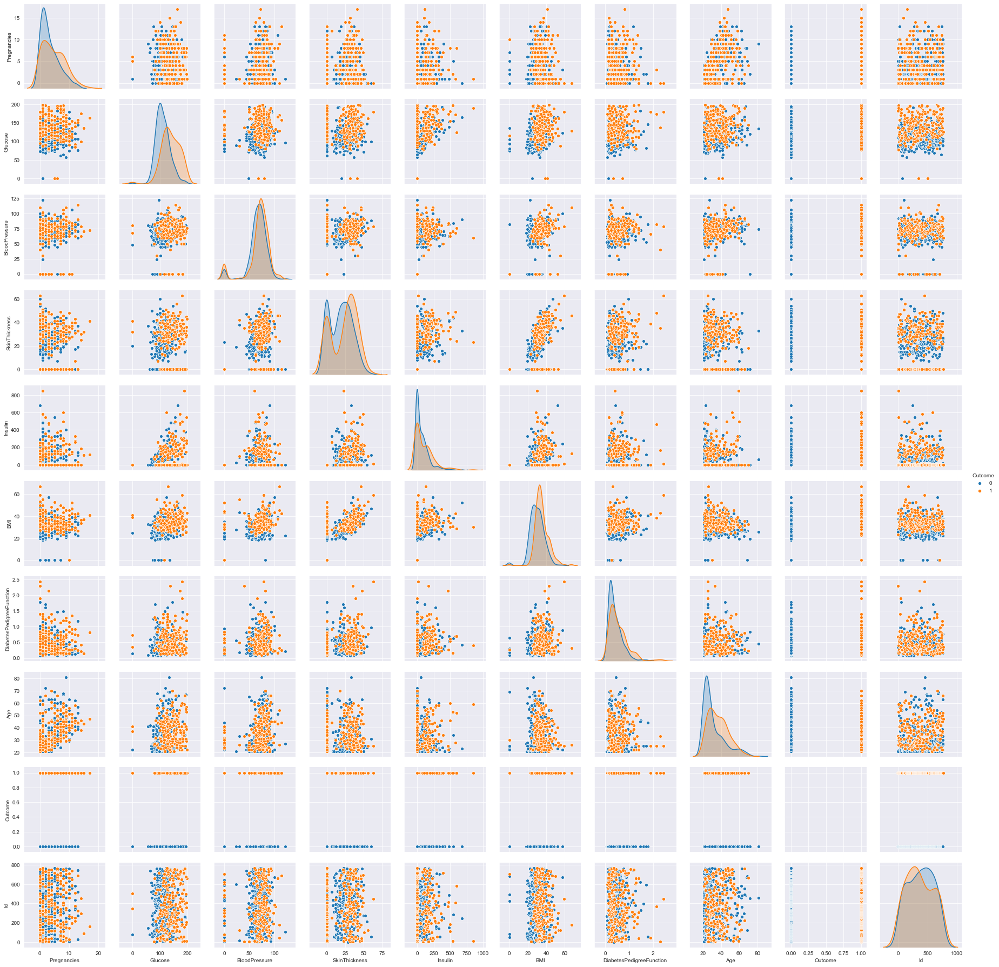

In [23]:
# посмотрим как признаки корелируют с диабетом
sns.pairplot(df,hue='Outcome')

In [24]:
# Оценим глюкозу и инсулин

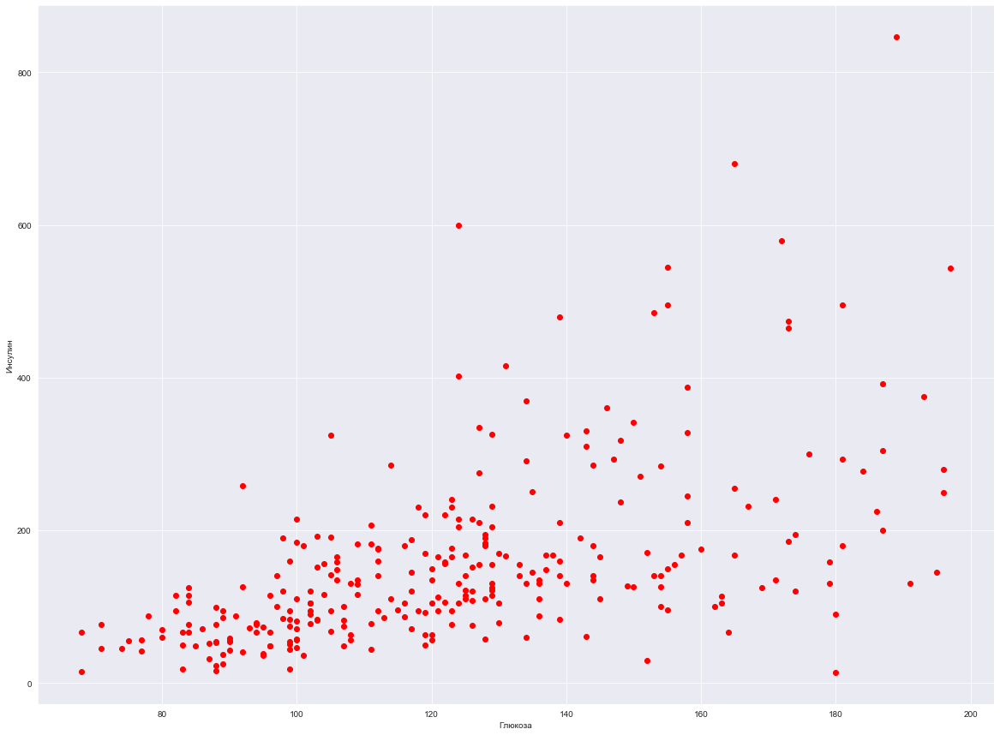

In [25]:
plt.figure(figsize=(20, 15))
data2 = df[(df.Insulin != 0) & (df.Glucose >=50)]
plt.xlabel('Глюкоза')
plt.ylabel('Инсулин')
plt.plot(data2.Glucose, data2.Insulin, 'o', color="r")
plt.show()

на графике видно что чем выше уровень глюкозы, тем больший разброс по инсулину

In [26]:
# Оценим возраст

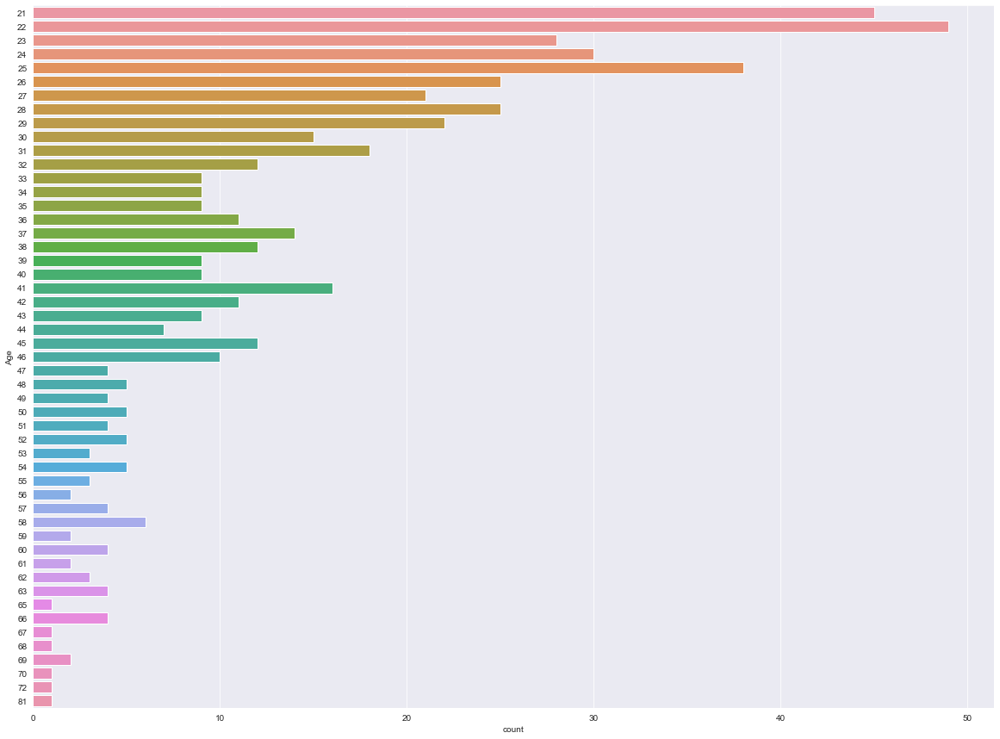

In [27]:
plt.figure(figsize=(20, 15))
sns.countplot(y="Age", data=df);

Из графика понятно что в исследовании принимали участие чаще женьщины моложе 45 лет, в связи с этим можно уверенно сказать что 
в данной выборке с большей вероятносью преобладает диабет первого типа, так как диабет второго типа характерен для людей старше 50 лет.

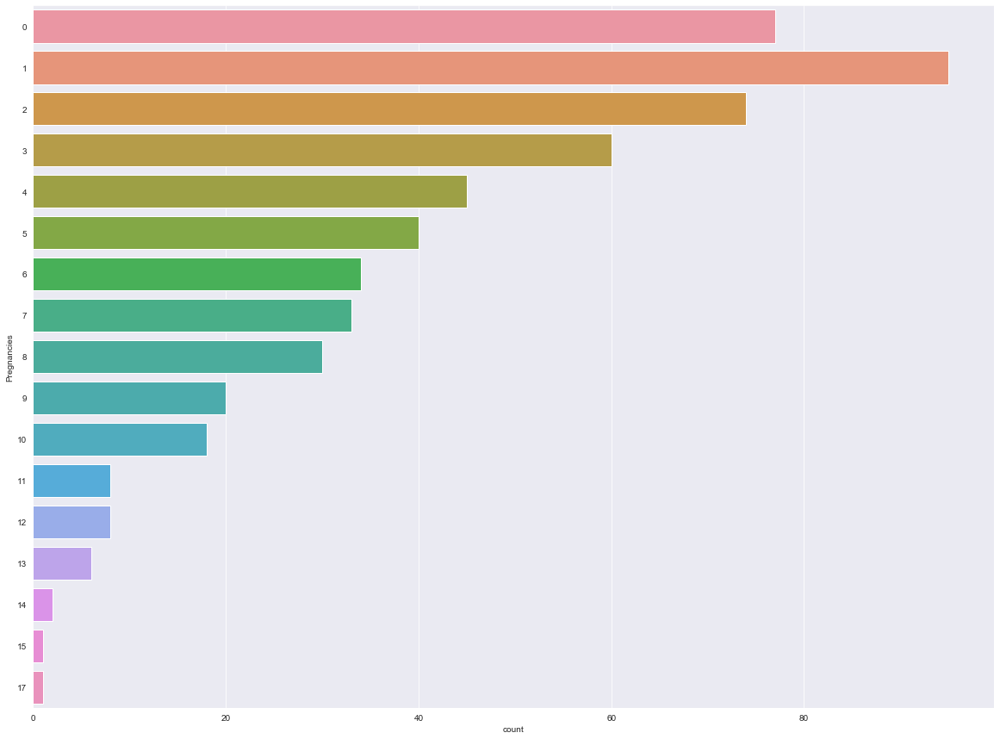

In [28]:
plt.figure(figsize=(20, 15))
sns.countplot(y="Pregnancies", data=df);

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x00000248DF56B4C8>,
      dtype=object)

<Figure size 1800x3240 with 0 Axes>

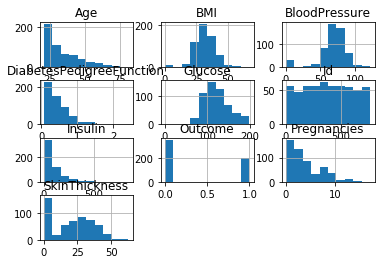

In [34]:
fig = plt.figure(figsize=(25,45))
df.hist()

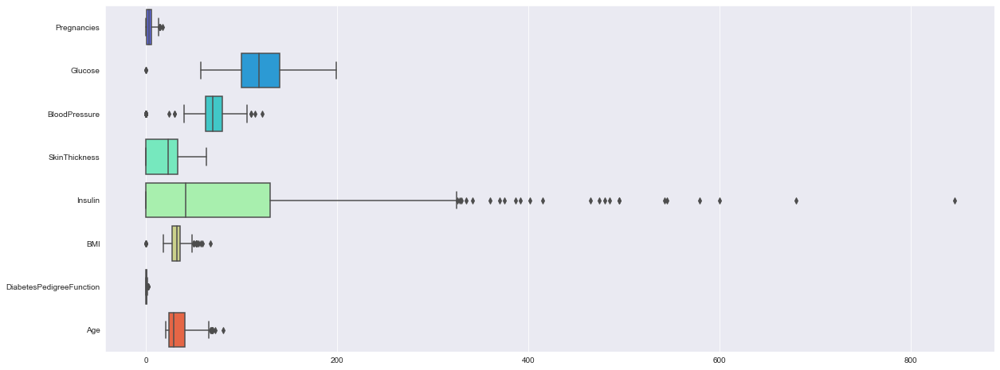

In [30]:
# Оценим выбросы
drawboxplot(df.drop(["Id", "Outcome"], axis=1))

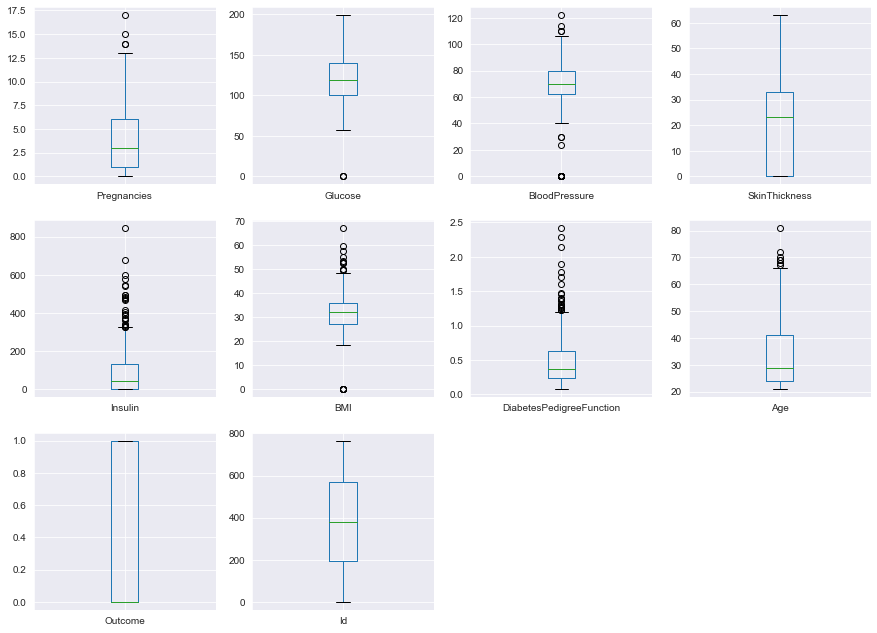

In [31]:
df.plot(kind='box', subplots=True, layout=(4,4), sharex=False,sharey=False ,figsize =(15,15))
plt.show()

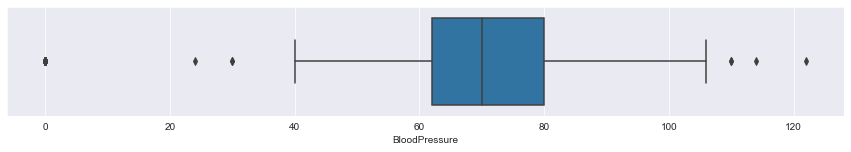

In [32]:
target='BloodPressure'
show_one_box_plot(df, target)
# странные показатели кровяного давления, обычно это две цифры 120/80  90/60 и тд, что тут приведена за цифра можно только догадываться

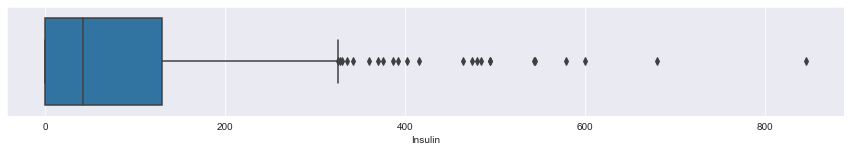

In [33]:
target='Insulin'
show_one_box_plot(df, target)
# d норме уровень инсулина 15-180 пмоль/литр, по данному графику можно предположить что у кого выше 350 у всех сд, инсулин начинает вырабатывать все больше и больше если клетки резистентны к инсулину

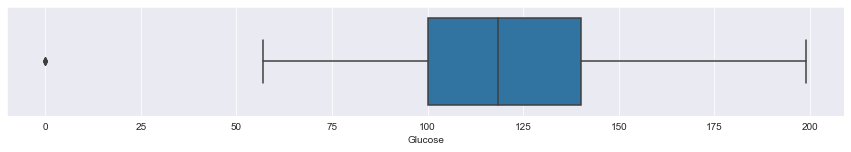

In [34]:
target='Glucose'
show_one_box_plot(df, target)
# уровень глюкозы 3.3-5.5 ммоль на литр, или 60-100мг%, в нашем случае можно думать что у всех у кого ниже этих показателей данные не верны, а у тех у кого выше вероятно сахарный диабет

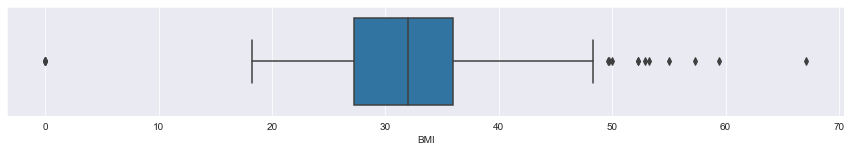

In [35]:
target='BMI'
show_one_box_plot(df, target)
# Индекс массы тела не может быть ниже 18, тут явное отсутсвие данных

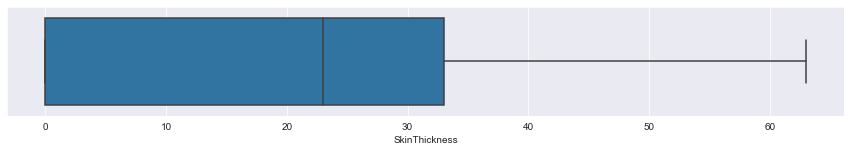

In [36]:
target='SkinThickness'
show_one_box_plot(df, target)

Видим явыне выброс в показателях инсулина, какие то не верные данные в давлении крови, и глюкоза такая бывает только у трупа, даные нужно исправлять

### Посмотрим на распределения цифровых признаков

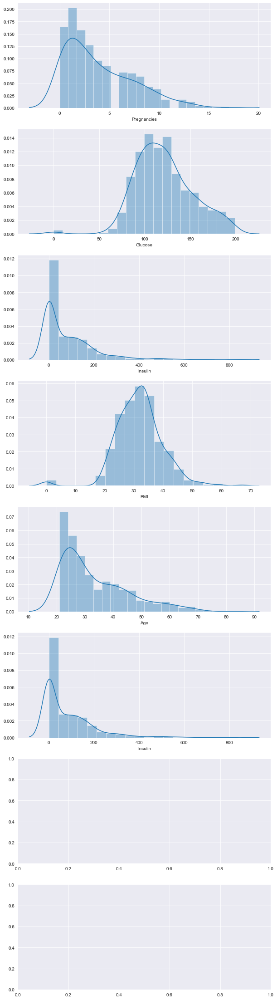

In [37]:
raspred_hist(num_features)

# Работа с данными, корректировка создание новых признаков

In [38]:
# Перепишем закопируем данные в новую переменную и будем с ней работать

In [127]:
data=df

In [128]:
def correct_value(data, target, value):
    data.loc[data[target] < value, target] = data[target].median()
    show_one_box_plot(df, target)
    return data

In [129]:
## Попытка отобрать наиболее важные признаки
model= RandomForestClassifier(n_estimators=100,random_state=0)
X=data[data.columns[:10]]
Y=data['Outcome']
model.fit(X,Y)
pd.Series(model.feature_importances_,index=X.columns).sort_values(ascending=False)

Outcome                     0.749942
Glucose                     0.094667
BMI                         0.047654
Age                         0.035929
DiabetesPedigreeFunction    0.019071
SkinThickness               0.016738
Insulin                     0.010593
Id                          0.009533
Pregnancies                 0.008362
BloodPressure               0.007511
dtype: float64

In [184]:
# Подготовим функцию обработки дата сета
def job(data):
      # Заменим тех у кого не измерили глюкозу на средние значения
      data = correct_value(data, 'Glucose', 60)
      # Установим средние значения для кровянного давления, у кого не измерили
      data = correct_value(data, 'BloodPressure', 60)
      # Установим средние значения тех у кого индекс массы тела меньше 18
      data = correct_value(data,'BMI', 18)
      # откорректируем толщину кожы в 5 мм так как этот фактор влияет на усвоение инсулина, и его нужно было измерять, тут явно пропуски
      data = correct_value(data,'SkinThickness', 5)
      # Откорректируем нижнюю границу нормы по инсулину
      data = correct_value(data,'Insulin', 15)

      #data=data.drop(['BloodPressure', 'SkinThickness', 'Insulin'], axis=1)
      
      # Добавим логарифмы и квадраты для числовых переменных
      data = create_poly_features(data, num_features)
      data = create_log_features(data, num_features)
      return data



,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome,Id,Pregnancies sqr,Glucose sqr,BMI sqr,Age sqr,Pregnancies_log,Glucose_log,BMI_log,Age_log
0,1,85.0,66.0,29.0,41.5,26.6,0.351,31,0,1,1.0,7225.0,707.56,961.0,0.000000,4.442651,3.280911,3.433987
1,8,183.0,64.0,23.0,41.5,23.3,0.672,32,1,2,64.0,33489.0,542.89,1024.0,2.079442,5.209486,3.148453,3.465736
2,1,89.0,66.0,23.0,94.0,28.1,0.167,21,0,3,1.0,7921.0,789.61,441.0,0.000000,4.488636,3.335770,3.044522
3,0,137.0,70.0,35.0,168.0,43.1,2.288,33,1,4,0.0,18769.0,1857.61,1089.0,0.000000,4.919981,3.763523,3.496508
4,5,116.0,74.0,23.0,41.5,25.6,0.201,30,0,5,25.0,13456.0,655.36,900.0,1.609438,4.753590,3.242592,3.401197
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
547,9,89.0,62.0,23.0,41.5,22.5,0.142,33,0,762,81.0,7921.0,506.25,1089.0,2.197225,4.488636,3.113515,3.496508
548,10,101.0,76.0,48.0,180.0,32.9,0.171,63,0,763,100.0,10201.0,1082.41,3969.0,2.302585,4.615121,3.493473,4.143135
549,2,122.0,70.0,27.0,41.5,36.8,0.340,27,0,764,4.0,14884.0,1354.24,729.0,0.693147,4.804021,3.605498,3.295837
550,5,121.0,72.0,23.0,112.0,26.2,0.245,30,0,765,25.0,14641.0,686.44,900.0,1.609438,4.795791,3.265759,3.401197


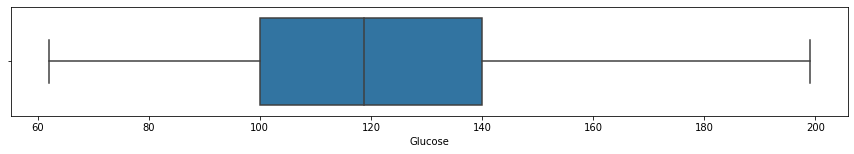

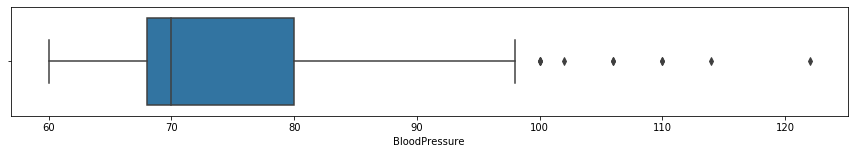

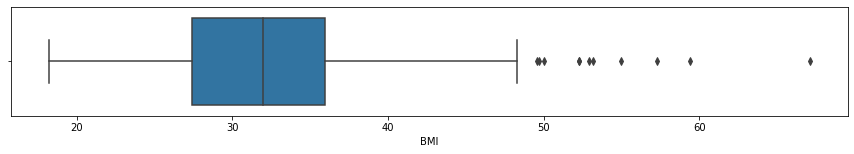

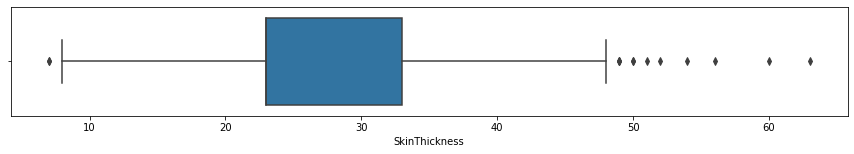

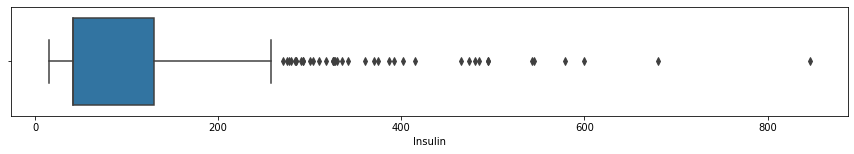

In [185]:
data=df
data = job(data)
data

In [186]:
data.to_pickle('work_data.pkl')

# Получение Бизлайна на обработанных данных

In [187]:
data = pd.read_pickle('work_data.pkl')

In [188]:
data.shape

(552, 18)

In [189]:
def get_tain_test_split(data):
    # Разделим выборку на трейн и тест
    target = 'Outcome'
    y = data[target]
    scaler = StandardScaler()
    ids = data['Id']
    X = scaler.fit_transform(data.drop([target, 'Id'], axis=1))
    X_train, X_test, y_train, y_test = train_test_split(X, y, shuffle=True, test_size=0.15,                            random_state=42)
    return X_train, X_test, y_train, y_test, y, X

In [190]:
X_train, X_test, y_train, y_test, y, X = get_tain_test_split(data)

,Mean score,Std score,Algorithm
0,0.652837,0.036445,LogisticRegression
1,0.585531,0.053273,DecisionTreeClassifier
2,0.651397,0.041802,RandomForestClassifier
3,0.643406,0.025947,GradientBoostingClassifier
4,0.673502,0.050240,AdaBoostClassifier
5,0.639417,0.049295,XGBClassifier
6,0.651591,0.028357,CatBoostClassifier
7,0.624532,0.028570,LGBMClassifier


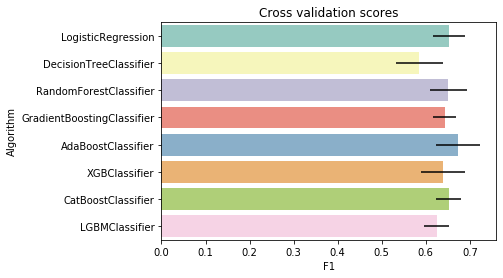

In [191]:
random_state= 42
classifiers = {
    'LogisticRegression': LogisticRegression(random_state=random_state),
    'DecisionTreeClassifier': DecisionTreeClassifier(random_state=random_state),
    'RandomForestClassifier': RandomForestClassifier(random_state=random_state),
    'GradientBoostingClassifier': GradientBoostingClassifier(random_state=random_state),
    'AdaBoostClassifier': AdaBoostClassifier(random_state=random_state),
    'XGBClassifier': xgb.XGBClassifier(random_state=random_state),
    'CatBoostClassifier': catb.CatBoostClassifier(random_state=random_state),
    'LGBMClassifier': lgbm.LGBMClassifier(random_state=random_state)
}
calculate_cross_val_score(X, y, classifiers)

In [155]:
# По графику видно что самыми интересными для нас являются AdaBoostClassifier

In [49]:
cv = StratifiedKFold(n_splits=5, random_state=43, shuffle=True)

In [50]:
#Будем подбирать параметры гридсерчем
parameters = {
    'max_depth':[i for i in range(1,4,1)] ,
    'n_estimators':[i for i in range(50,100,10)], 
    'max_features':[i for i in range(3,8,1)],
    'min_samples_leaf':[i for i in range(6,16,2)],
    'min_samples_split':[2,3,5],
    'random_state':[42]}

GB = GridSearchCV(
    GradientBoostingClassifier(),
    cv = cv,
    n_jobs=-1,
    param_grid = parameters,
    scoring = 'f1')

In [51]:
fit_and_show(GB, X_train, X_test, y_train, y_test)

Train subset

              precision    recall  f1-score   support

           0       0.87      0.93      0.90       252
           1       0.84      0.73      0.78       134

    accuracy                           0.86       386
   macro avg       0.86      0.83      0.84       386
weighted avg       0.86      0.86      0.86       386

Test subset

              precision    recall  f1-score   support

           0       0.76      0.89      0.82       102
           1       0.77      0.56      0.65        64

    accuracy                           0.77       166
   macro avg       0.77      0.73      0.74       166
weighted avg       0.77      0.77      0.76       166



In [52]:
GB.best_params_

{'max_depth': 2,
 'max_features': 4,
 'min_samples_leaf': 6,
 'min_samples_split': 2,
 'n_estimators': 50,
 'random_state': 42}

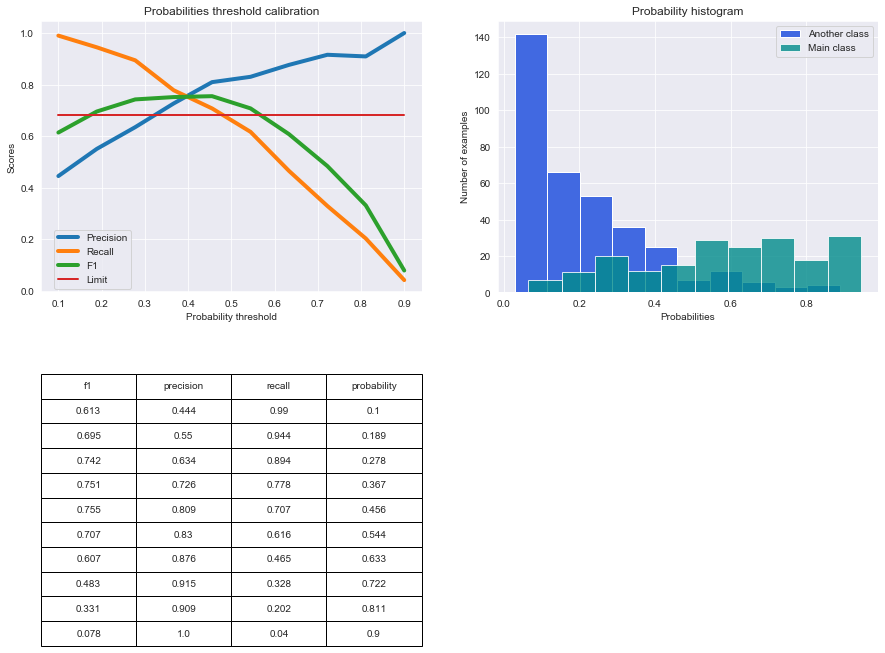

In [53]:
y_test_proba = GB.predict_proba(X)[:, 1]
show_proba_calibration_plots(y_test_proba, y)

In [166]:
grid = {
    'n_estimators' : [i for i in range(5,30,5)],
    'learning_rate': [0.1, 0.2, 0.3, 0.4, 0.6, 0.8, 1.0],
    'algorithm' : ['SAMME', 'SAMME.R']}

clf = AdaBoostClassifier(GradientBoostingClassifier(
                            max_depth= 1,
                            max_features= 3,
                            min_samples_leaf= 14,
                            min_samples_split= 2,
                            n_estimators=70,
                            random_state= 42))
rs = GridSearchCV(clf, grid, n_jobs=-1, cv=5, scoring = 'f1')
fit_and_show(rs, X_train, X_test, y_train, y_test)

Train subset

              precision    recall  f1-score   support

           0       0.85      0.90      0.87       306
           1       0.78      0.71      0.75       163

    accuracy                           0.83       469
   macro avg       0.82      0.80      0.81       469
weighted avg       0.83      0.83      0.83       469

Test subset

              precision    recall  f1-score   support

           0       0.77      0.83      0.80        48
           1       0.74      0.66      0.70        35

    accuracy                           0.76        83
   macro avg       0.76      0.75      0.75        83
weighted avg       0.76      0.76      0.76        83



In [55]:
rs.best_estimator_

AdaBoostClassifier(algorithm='SAMME',
                   base_estimator=GradientBoostingClassifier(max_depth=1,
                                                             max_features=3,
                                                             min_samples_leaf=14,
                                                             n_estimators=70,
                                                             random_state=42),
                   learning_rate=0.2, n_estimators=15)

In [56]:
fit_and_show(rs, X_train, X_test, y_train, y_test)

Train subset

              precision    recall  f1-score   support

           0       0.86      0.92      0.89       252
           1       0.82      0.72      0.76       134

    accuracy                           0.85       386
   macro avg       0.84      0.82      0.83       386
weighted avg       0.85      0.85      0.84       386

Test subset

              precision    recall  f1-score   support

           0       0.75      0.86      0.80       102
           1       0.71      0.55      0.62        64

    accuracy                           0.74       166
   macro avg       0.73      0.70      0.71       166
weighted avg       0.74      0.74      0.73       166



In [57]:
rs.best_params_

{'algorithm': 'SAMME', 'learning_rate': 0.2, 'n_estimators': 15}

In [162]:
param_grid = {
    'penalty' : ['l1', 'l2'],
    'C' : [0.001, 0.01, 0.015, 0.1],
    'solver' : ['liblinear', 'lgfbs', 'sag', 'saga'],
    'max_iter': [1000, 1500, 2000],
    'multi_class':['ovr', 'multinormal', 'auto']
    },

lg = LogisticRegression(random_state= 42)
lgs = GridSearchCV(lg, param_grid, n_jobs=-1, cv=5, scoring = 'f1')

fit_and_show(lgs, X_train, X_test, y_train, y_test)



Train subset

              precision    recall  f1-score   support

           0       0.83      0.77      0.80       306
           1       0.62      0.69      0.65       163

    accuracy                           0.74       469
   macro avg       0.72      0.73      0.73       469
weighted avg       0.75      0.74      0.75       469

Test subset

              precision    recall  f1-score   support

           0       0.81      0.73      0.77        48
           1       0.68      0.77      0.72        35

    accuracy                           0.75        83
   macro avg       0.74      0.75      0.74        83
weighted avg       0.76      0.75      0.75        83



In [59]:
lgs.best_params_

{'C': 0.001,
 'max_iter': 1000,
 'multi_class': 'ovr',
 'penalty': 'l2',
 'solver': 'liblinear'}

In [163]:
ada = AdaBoostClassifier(random_state=42)
ada_random2 = RandomizedSearchCV(estimator = ada, 
param_distributions = grid,
n_iter=100,
cv = 3, 
verbose=2,
random_state=42,
n_jobs = -1)
ada_random2.fit(X_train, y_train)

NameError: name 'grid' is not defined

In [61]:
fit_and_show(ada_random2, X_train, X_test, y_train, y_test)

Fitting 3 folds for each of 70 candidates, totalling 210 fits
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done 210 out of 210 | elapsed:    1.4s finished
Train subset

              precision    recall  f1-score   support

           0       0.83      0.87      0.85       252
           1       0.73      0.66      0.69       134

    accuracy                           0.80       386
   macro avg       0.78      0.76      0.77       386
weighted avg       0.79      0.80      0.79       386

Test subset

              precision    recall  f1-score   support

           0       0.76      0.88      0.82       102
           1       0.75      0.56      0.64        64

    accuracy                           0.76       166
   macro avg       0.76      0.72      0.73       166
weighted avg       0.76      0.76      0.75       166



In [62]:
grid = {
    'n_estimators' : [i for i in range(5,30,5)],
    'learning_rate': [0.1, 0.2, 0.3, 0.4, 0.6, 0.8, 1.0],
    'algorithm' : ['SAMME', 'SAMME.R']}

clf = AdaBoostClassifier(RandomForestClassifier(
                            max_depth=2,
                            max_features=5,
                            min_samples_leaf=10,
                            min_samples_split= 10,
                            n_estimators=10,
                            random_state= 42))
gs_forest = GridSearchCV(clf, grid, n_jobs=-1, cv=cv, scoring = 'f1')
fit_and_show(gs_forest, X_train, X_test, y_train, y_test)

Train subset

              precision    recall  f1-score   support

           0       0.87      0.90      0.89       252
           1       0.81      0.75      0.78       134

    accuracy                           0.85       386
   macro avg       0.84      0.83      0.83       386
weighted avg       0.85      0.85      0.85       386

Test subset

              precision    recall  f1-score   support

           0       0.76      0.87      0.81       102
           1       0.73      0.56      0.64        64

    accuracy                           0.75       166
   macro avg       0.75      0.72      0.72       166
weighted avg       0.75      0.75      0.75       166



In [63]:
X_train.shape

(386, 19)

In [192]:
ada = AdaBoostClassifier(
    RandomForestClassifier(
        max_depth=2,
        min_samples_leaf=5,
        criterion='entropy',
        min_samples_split=5,
        class_weight='balanced',
        max_leaf_nodes=12,
        random_state=43,
        n_jobs=-1),
    
    algorithm='SAMME',
    random_state=43,
    learning_rate=0.11,
    n_estimators=27)
fit_and_show(ada, X_train, X_test, y_train, y_test)

Train subset

              precision    recall  f1-score   support

           0       0.89      0.80      0.84       306
           1       0.68      0.81      0.74       163

    accuracy                           0.80       469
   macro avg       0.78      0.80      0.79       469
weighted avg       0.82      0.80      0.81       469

Test subset

              precision    recall  f1-score   support

           0       0.82      0.77      0.80        48
           1       0.71      0.77      0.74        35

    accuracy                           0.77        83
   macro avg       0.77      0.77      0.77        83
weighted avg       0.78      0.77      0.77        83



In [65]:
lbgm_model = LGBMClassifier(random_state=42, n_jobs=-1, metric='f1')
xgb_params = {
    'max_depth': range (2, 6, 1),
    'n_estimators': range(70, 100, 10),
    'learning_rate': [0.1, 0.01, 0.05],
    'gamma':[0,0.3,0.2,0.1],
    'reg_alpha': [1, 0.5, 1.1], #L1 регуляризация
    'reg_lambda': [1, 0.5, 1,1] #L2 регуляризация
}
lbgt = GridSearchCV(lbgm_model, xgb_params, cv=cv, scoring="f1", n_jobs=-1, verbose=True)
fit_and_show(lbgt, X_train, X_test, y_train, y_test)

Fitting 5 folds for each of 1728 candidates, totalling 8640 fits
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done 124 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 874 tasks      | elapsed:   10.0s
[Parallel(n_jobs=-1)]: Done 1639 tasks      | elapsed:   19.0s
[Parallel(n_jobs=-1)]: Done 2689 tasks      | elapsed:   31.2s
[Parallel(n_jobs=-1)]: Done 4039 tasks      | elapsed:   47.6s
[Parallel(n_jobs=-1)]: Done 5689 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 7639 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 8625 out of 8640 | elapsed:  1.7min remaining:    0.1s
[Parallel(n_jobs=-1)]: Done 8640 out of 8640 | elapsed:  1.7min finished
[LightGBM] [Warning] Unknown parameter: gamma
Train subset

              precision    recall  f1-score   support

           0       0.86      0.91      0.89       252
           1       0.82      0.72      0.77       134

    accuracy                           0

In [66]:
lbgt.best_estimator_

LGBMClassifier(gamma=0, learning_rate=0.05, max_depth=2, metric='f1',
               n_estimators=90, random_state=42, reg_alpha=1, reg_lambda=0.5)

In [67]:
model_lightgbm = LGBMClassifier(
    random_state=43,
    metric='f1',
    silent=False,
    learning_rate=0.1,
    max_depth=2,
    min_data_in_leaf=10,
    num_leaves=7,
    num_iterations=30,
    is_unbalance=True)
fit_and_show(model_lightgbm, X_train, X_test, y_train, y_test)

[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Info] Number of positive: 134, number of negative: 252
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000163 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1242
[LightGBM] [Info] Number of data points in the train set: 386, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.347150 -> initscore=-0.631589
[LightGBM] [Info] Start training from score -0.631589
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Train subset

              precision    recall  f1-score   support

           0       0.90      0.83      0.87       252
   

In [68]:
xgb_model = xgb.XGBClassifier(random_state=42, n_jobs=-1, objective='binary:logistic')
xgb_params = {
    'max_depth': range (2, 6, 1),
    'n_estimators': range(100, 150, 10),
    'learning_rate': [0.1, 0.01, 0.05],
    'gamma':[0,0.3,0.2,0.1],
    'reg_alpha': [1, 0.5, 1.1], #L1 регуляризация
    'reg_lambda': [1, 0.5, 1,1] #L2 регуляризация
}
gsxgb = GridSearchCV(xgb_model, xgb_params, cv=cv, scoring="f1", n_jobs=-1, verbose=True)
fit_and_show(gsxgb, X_train, X_test, y_train, y_test)


Fitting 5 folds for each of 2880 candidates, totalling 14400 fits
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:    4.7s
[Parallel(n_jobs=-1)]: Done 434 tasks      | elapsed:   12.9s
[Parallel(n_jobs=-1)]: Done 784 tasks      | elapsed:   26.4s
[Parallel(n_jobs=-1)]: Done 1234 tasks      | elapsed:   48.8s
[Parallel(n_jobs=-1)]: Done 1784 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2434 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 3184 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 4034 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 4984 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 6034 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 7184 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 8434 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 9784 tasks     

In [69]:
print('Best params: {}'.format(gsxgb.best_params_))

Best params: {'gamma': 0.3, 'learning_rate': 0.01, 'max_depth': 4, 'n_estimators': 140, 'reg_alpha': 1.1, 'reg_lambda': 1}


# Предсказания

In [200]:
# прочитаем данные из файла
df_test = pd.read_csv('./data/test.csv')
df_test.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Id
0,6,148,72,35,0,33.6,0.627,50,0
1,8,125,96,0,0,0.0,0.232,54,9
2,10,168,74,0,0,38.0,0.537,34,11
3,10,139,80,0,0,27.1,1.441,57,12
4,5,166,72,19,175,25.8,0.587,51,14


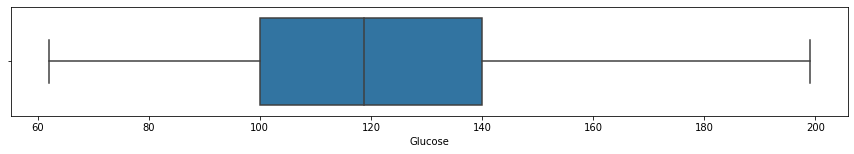

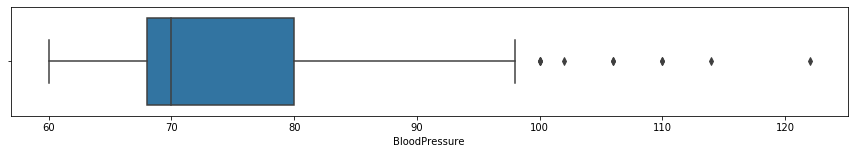

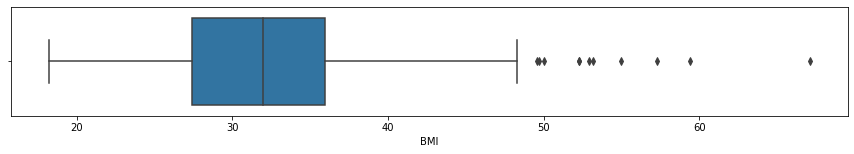

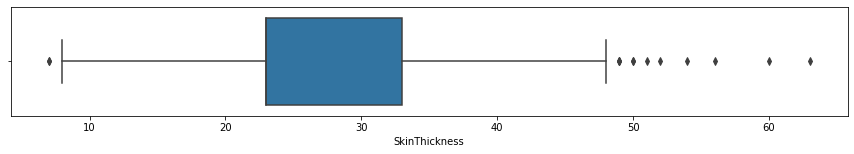

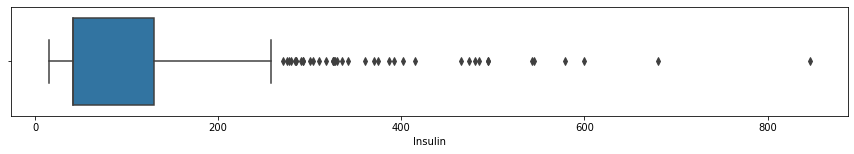

In [201]:
data_test = job(df_test)

In [202]:
X_train.shape

(469, 16)

In [203]:
data_test

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Id,Pregnancies sqr,Glucose sqr,BMI sqr,Age sqr,Pregnancies_log,Glucose_log,BMI_log,Age_log
0,6,148.0,72.0,35.0,0.0,33.6,0.627,50,0,36.0,21904.0,1128.96,2500.0,1.791759,4.997212,3.514526,3.912023
1,8,125.0,96.0,23.0,0.0,32.8,0.232,54,9,64.0,15625.0,1075.84,2916.0,2.079442,4.828314,3.490429,3.988984
2,10,168.0,74.0,23.0,0.0,38.0,0.537,34,11,100.0,28224.0,1444.00,1156.0,2.302585,5.123964,3.637586,3.526361
3,10,139.0,80.0,23.0,0.0,27.1,1.441,57,12,100.0,19321.0,734.41,3249.0,2.302585,4.934474,3.299534,4.043051
4,5,166.0,72.0,19.0,175.0,25.8,0.587,51,14,25.0,27556.0,665.64,2601.0,1.609438,5.111988,3.250374,3.931826
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
211,1,121.0,78.0,39.0,74.0,39.0,0.261,28,751,1.0,14641.0,1521.00,784.0,0.000000,4.795791,3.663562,3.332205
212,3,108.0,62.0,24.0,0.0,26.0,0.223,25,752,9.0,11664.0,676.00,625.0,1.098612,4.682131,3.258097,3.218876
213,0,181.0,88.0,44.0,510.0,43.3,0.222,26,753,0.0,32761.0,1874.89,676.0,0.000000,5.198497,3.768153,3.258097
214,9,170.0,74.0,31.0,0.0,44.0,0.403,43,761,81.0,28900.0,1936.00,1849.0,2.197225,5.135798,3.784190,3.761200


In [179]:
ids = data_test['Id']
data_test = data_test.drop(['Id'], axis=1)

In [180]:
scaler = StandardScaler()
X = scaler.fit_transform(data_test)

In [181]:
y_predict =  ada.predict(X)

In [182]:
is_default = pd.DataFrame({'Id': ids,'Outcome':y_predict})

is_default.to_csv('predictions.csv', index=False)

In [204]:
models = [
   LGBMClassifier(
    random_state=43,
    metric='f1',
    silent=False,
    learning_rate=0.1,
    max_depth=2,
    min_data_in_leaf=10,
    num_leaves=7,
    num_iterations=30,
    is_unbalance=True),

    LogisticRegression(
        C=0.01,
        random_state=43,
        max_iter=1000,
        multi_class='ovr',
        penalty='l2',
        solver='liblinear'
    ),

    AdaBoostClassifier(
        RandomForestClassifier(
            max_depth=2,
            min_samples_leaf=5,
            criterion='entropy',
            min_samples_split=5,
            class_weight='balanced',
            max_leaf_nodes=12,
            random_state=43,
            n_jobs=-1),
        
        algorithm='SAMME',
        random_state=43,
        learning_rate=0.11,
        n_estimators=27),
        
     RandomForestClassifier(
            max_depth=2,
            min_samples_leaf=5,
            criterion='entropy',
            min_samples_split=5,
            class_weight='balanced',
            max_leaf_nodes=12,
            random_state=43,
            n_jobs=-1),
    
]

S_train, S_test = stacking(models,                   
                           X_train, y_train, X_test,   
                           regression=False, 
                           mode='oof_pred_bag', 
                           needs_proba=False,
                           save_dir=None, 
                           metric='f1', 
                           n_folds=4, 
                           stratified=True,
                           shuffle=True,  
                           random_state=42)

[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Info] Number of positive: 122, number of negative: 229
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000647 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 904
[LightGBM] [Info] Number of data points in the train set: 351, number of used features: 16
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.347578 -> initscore=-0.629701
[LightGBM] [Info] Start training from score -0.629701
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Info] Numb

In [205]:
# В качестве металгоритма выберем логистическую регрессию
clf_stack = LogisticRegression(multi_class='auto', solver='lbfgs', random_state=42)

In [206]:
fit_and_show(clf_stack, S_train, S_test, y_train, y_test)

Train subset

              precision    recall  f1-score   support

           0       0.85      0.78      0.82       306
           1       0.65      0.75      0.70       163

    accuracy                           0.77       469
   macro avg       0.75      0.77      0.76       469
weighted avg       0.78      0.77      0.78       469

Test subset

              precision    recall  f1-score   support

           0       0.83      0.79      0.81        48
           1       0.73      0.77      0.75        35

    accuracy                           0.78        83
   macro avg       0.78      0.78      0.78        83
weighted avg       0.79      0.78      0.78        83



In [76]:
XGBClassifier(
        random_state=42,
        n_jobs=-1,
        learning_rate=0.1, 
        n_estimators=90,
        max_depth=3,
        reg_alpha=1.1,
        reg_lambda=1,
        use_label_encoder=False,
        eval_metric='logloss')

XGBClassifier(base_score=None, booster=None, colsample_bylevel=None,
              colsample_bynode=None, colsample_bytree=None,
              eval_metric='logloss', gamma=None, gpu_id=None,
              importance_type='gain', interaction_constraints=None,
              learning_rate=0.1, max_delta_step=None, max_depth=3,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=90, n_jobs=-1, num_parallel_tree=None,
              random_state=42, reg_alpha=1.1, reg_lambda=1,
              scale_pos_weight=None, subsample=None, tree_method=None,
              use_label_encoder=False, validate_parameters=None,
              verbosity=None)

In [80]:
    AdaBoostClassifier(
        algorithm='SAMME',
        base_estimator=GradientBoostingClassifier(
                            max_depth=1,
                            max_features=3,
                            min_samples_leaf=14,
                            n_estimators=70,
                            random_state=42),
        learning_rate=0.1,
        n_estimators=25),


(AdaBoostClassifier(algorithm='SAMME',
                    base_estimator=GradientBoostingClassifier(max_depth=1,
                                                              max_features=3,
                                                              min_samples_leaf=14,
                                                              n_estimators=70,
                                                              random_state=42),
                    learning_rate=0.1, n_estimators=25),)

In [81]:
     GradientBoostingClassifier(
            max_depth=1,
            max_features=4,
            min_samples_leaf=6,
            min_samples_split=2,
            n_estimators=90,
            random_state=42
        ),


(GradientBoostingClassifier(max_depth=1, max_features=4, min_samples_leaf=6,
                            n_estimators=90, random_state=42),)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Id,Pregnancies sqr,Glucose sqr,BMI sqr,Age sqr,Pregnancies_log,Glucose_log,BMI_log,Age_log
0,6,148.0,72.0,35.0,0.0,33.6,0.627,50,0,36.0,21904.0,1128.96,2500.0,1.791759,4.997212,3.514526,3.912023
1,8,125.0,96.0,23.0,0.0,32.8,0.232,54,9,64.0,15625.0,1075.84,2916.0,2.079442,4.828314,3.490429,3.988984
2,10,168.0,74.0,23.0,0.0,38.0,0.537,34,11,100.0,28224.0,1444.00,1156.0,2.302585,5.123964,3.637586,3.526361
3,10,139.0,80.0,23.0,0.0,27.1,1.441,57,12,100.0,19321.0,734.41,3249.0,2.302585,4.934474,3.299534,4.043051
4,5,166.0,72.0,19.0,175.0,25.8,0.587,51,14,25.0,27556.0,665.64,2601.0,1.609438,5.111988,3.250374,3.931826
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
211,1,121.0,78.0,39.0,74.0,39.0,0.261,28,751,1.0,14641.0,1521.00,784.0,0.000000,4.795791,3.663562,3.332205
212,3,108.0,62.0,24.0,0.0,26.0,0.223,25,752,9.0,11664.0,676.00,625.0,1.098612,4.682131,3.258097,3.218876
213,0,181.0,88.0,44.0,510.0,43.3,0.222,26,753,0.0,32761.0,1874.89,676.0,0.000000,5.198497,3.768153,3.258097
214,9,170.0,74.0,31.0,0.0,44.0,0.403,43,761,81.0,28900.0,1936.00,1849.0,2.197225,5.135798,3.784190,3.761200


In [218]:
scaler = StandardScaler()
X_t = scaler.fit_transform(data_test)
print(X.shape)

y_predict_stack =  clf_stack.predict(X_t)
print(y_predict_stack)


(216, 17)


ValueError: X has 17 features per sample; expecting 4

In [ ]:
is_default = pd.DataFrame({'Id': ids,'Outcome':y_predict_stack})

is_default.to_csv('predictions_stack.csv', index=False)